# Data Preprocessing & EDA

## Attaching Resources

### Importing Necessary Libraries

In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15,8)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

### Adding Dataset

In [144]:
wby = pd.read_csv('https://raw.githubusercontent.com/kunal-mallick/Wild-Blueberry-Yield/main/resources/train.csv')

wby

,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,15284,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.556302,0.476308,40.546480,7667.83619
15285,15285,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354413,0.388145,29.467434,3680.56025
15286,15286,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.422548,0.416786,32.299059,4696.44394
15287,15287,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.542170,0.434133,36.674243,6772.93347


In [148]:
wby.drop(columns=['id'], inplace=True)

wby.head(10)

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417
5,25.0,0.50,0.25,0.63,0.75,94.6,57.2,79.0,68.2,33.0,55.9,34.0,0.56,0.565239,0.484350,40.555019,7267.28344
6,12.5,0.25,0.38,0.50,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.498730,0.442193,35.517539,5739.68029
7,12.5,0.25,0.25,0.75,0.75,86.0,52.0,71.9,62.0,30.0,50.8,1.0,0.10,0.619888,0.529502,42.191013,7920.06175
8,25.0,0.50,0.38,0.38,0.75,94.6,57.2,79.0,68.2,33.0,55.9,16.0,0.26,0.532557,0.465367,36.166044,6465.37205
9,25.0,0.50,0.25,0.63,0.63,94.6,57.2,79.0,68.2,33.0,55.9,34.0,0.56,0.340063,0.381768,28.763565,3519.43131


In [145]:
wby_nrow = wby.shape[0]

In [146]:
def lost_record():

    wby_nrow_now = wby.shape[0]
    lost = wby_nrow - wby_nrow_now
    lost = (lost/wby_nrow)*100
    lost = round(lost, 2)

    return print('We lost ' + str(lost) + ' % data')


## Performing EDA In Dataset

### Performing Data Preprocessing

#### Applying Descriptive Statistics

In [68]:
wby.describe()

,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
count,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000
mean,7644.000000,19.704690,0.389314,0.286768,0.492675,0.592355,82.169887,49.673281,68.656256,59.229538,28.660553,48.568500,18.660865,0.324176,0.502741,0.446553,36.164950,6025.193999
std,4413.698468,6.595211,0.361643,0.059917,0.148115,0.139489,9.146703,5.546405,7.641807,6.610640,3.195367,5.390545,11.657582,0.163905,0.074390,0.037035,4.031087,1337.056850
min,0.000000,10.000000,0.000000,0.000000,0.000000,0.000000,69.700000,39.000000,58.200000,50.200000,24.300000,41.200000,1.000000,0.060000,0.192732,0.311921,22.079199,1945.530610
25%,3822.000000,12.500000,0.250000,0.250000,0.380000,0.500000,77.400000,46.800000,64.700000,55.800000,27.000000,45.800000,16.000000,0.260000,0.458246,0.419216,33.232449,5128.163510
50%,7644.000000,25.000000,0.500000,0.250000,0.500000,0.630000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,16.000000,0.260000,0.506600,0.446570,36.040675,6117.475900
75%,11466.000000,25.000000,0.500000,0.380000,0.630000,0.750000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,24.000000,0.390000,0.560445,0.474134,39.158238,7019.694380
max,15288.000000,40.000000,18.430000,0.585000,0.750000,0.750000,94.600000,57.200000,79.000000,68.200000,33.000000,55.900000,34.000000,0.560000,0.652144,0.535660,46.585105,8969.401840


#### Performing Typecasting

In [69]:
wby.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15289 entries, 0 to 15288
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    15289 non-null  int64  
 1   clonesize             15289 non-null  float64
 2   honeybee              15289 non-null  float64
 3   bumbles               15289 non-null  float64
 4   andrena               15289 non-null  float64
 5   osmia                 15289 non-null  float64
 6   MaxOfUpperTRange      15289 non-null  float64
 7   MinOfUpperTRange      15289 non-null  float64
 8   AverageOfUpperTRange  15289 non-null  float64
 9   MaxOfLowerTRange      15289 non-null  float64
 10  MinOfLowerTRange      15289 non-null  float64
 11  AverageOfLowerTRange  15289 non-null  float64
 12  RainingDays           15289 non-null  float64
 13  AverageRainingDays    15289 non-null  float64
 14  fruitset              15289 non-null  float64
 15  fruitmass          

#### Performing Missing Value Imputation

In [70]:
def missing_percentage(wby):

    m = wby.isna().sum()
    total = int(wby.shape[0])

    for i in range(len(wby.columns)):
        percentage =round((m[i]/total)*100)

        print(str(wby.columns[i]) + ' has ' + str(percentage) + ' % missing value(' + str(m[i]) + ')')

##### Missing Value Percentage

In [71]:
missing_percentage(wby)

id has 0 % missing value(0)
clonesize has 0 % missing value(0)
honeybee has 0 % missing value(0)
bumbles has 0 % missing value(0)
andrena has 0 % missing value(0)
osmia has 0 % missing value(0)
MaxOfUpperTRange has 0 % missing value(0)
MinOfUpperTRange has 0 % missing value(0)
AverageOfUpperTRange has 0 % missing value(0)
MaxOfLowerTRange has 0 % missing value(0)
MinOfLowerTRange has 0 % missing value(0)
AverageOfLowerTRange has 0 % missing value(0)
RainingDays has 0 % missing value(0)
AverageRainingDays has 0 % missing value(0)
fruitset has 0 % missing value(0)
fruitmass has 0 % missing value(0)
seeds has 0 % missing value(0)
yield has 0 % missing value(0)


- No Missing Value Present

#### Finding Unique Values In Dataset

In [72]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(np.sort(df[df.columns[i]].unique()))
        print('Total no of unique values ' +
              str(len(df[df.columns[i]].unique())))


In [73]:
uni(wby)


 All Unique Value in id
[    0     1     2 ... 15286 15287 15288]
Total no of unique values 15289

 All Unique Value in clonesize
[10.  12.5 20.  25.  37.5 40. ]
Total no of unique values 6

 All Unique Value in honeybee
[ 0.     0.25   0.5    0.537  0.75   6.64  18.43 ]
Total no of unique values 7

 All Unique Value in bumbles
[0.    0.042 0.058 0.065 0.117 0.25  0.26  0.293 0.38  0.56  0.585]
Total no of unique values 11

 All Unique Value in andrena
[0.    0.101 0.147 0.229 0.234 0.235 0.24  0.25  0.38  0.409 0.49  0.5
 0.56  0.63  0.707 0.75 ]
Total no of unique values 16

 All Unique Value in osmia
[0.    0.02  0.021 0.058 0.078 0.117 0.25  0.38  0.5   0.585 0.606 0.62
 0.63  0.75 ]
Total no of unique values 14

 All Unique Value in MaxOfUpperTRange
[69.7 77.4 79.  86.  89.  94.6]
Total no of unique values 6

 All Unique Value in MinOfUpperTRange
[39.  42.1 46.8 52.  57.2]
Total no of unique values 5

 All Unique Value in AverageOfUpperTRange
[58.2 64.7 65.6 71.9 79. ]
Total no o

### Checking for Duplicated Values

In [81]:
wby[wby.duplicated()]

,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield


- There is no duplicate vale in are dataset

### Visualizing The Data

#### Ploting Boxplot

KeyboardInterrupt: 

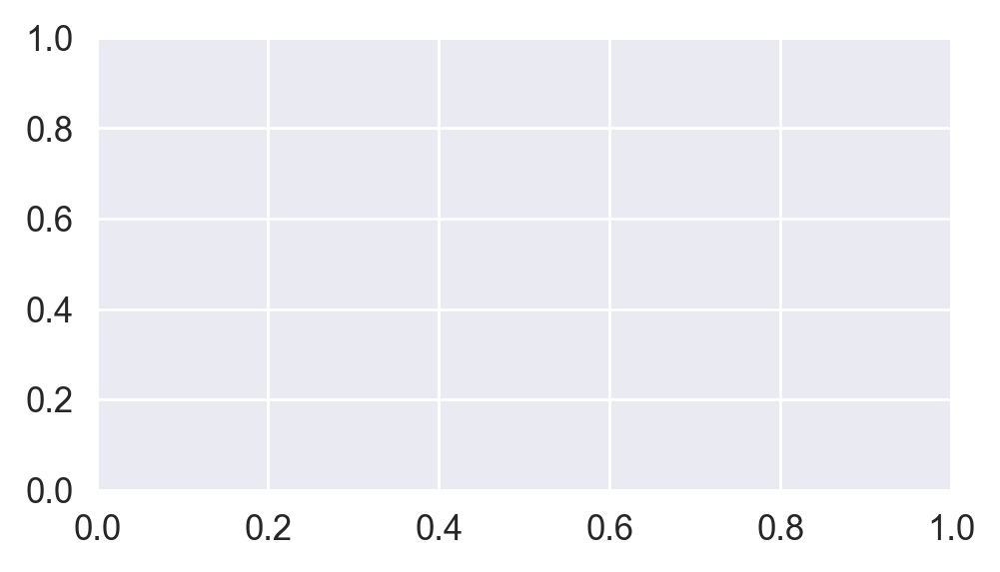

In [40]:
fig, ax = plt.subplots(3, 3, figsize = (15,8))

plt.setp(ax[0,0], title = 'PH')
sns.boxplot(wby['ph'], orient = 'h', ax = ax[0,0], color = '#ffadad')

plt.setp(ax[0,1], title = 'Hardness')
sns.boxplot(wby['Hardness'], orient = 'h', ax = ax[0,1], color = '#ffadad')

plt.setp(ax[0,2], title = 'Solids')
sns.boxplot(wby['Solids'], orient = 'h', ax = ax[0,2], color = '#ffadad')

plt.setp(ax[1,0], title = 'Chloramines')
sns.boxplot(wby['Chloramines'], orient = 'h', ax = ax[1,0], color = '#ffadad')

plt.setp(ax[1,1], title = 'Sulfate')
sns.boxplot(wby['Sulfate'], orient = 'h', ax = ax[1,1], color = '#ffd6a5')

plt.setp(ax[1,2], title = 'Conductivity')
sns.boxplot(wby['Conductivity'], orient = 'h', ax = ax[1,2], color = '#ffd6a5')

plt.setp(ax[2,0], title = 'Organic_carbon')
sns.boxplot(wby['Organic_carbon'], orient = 'h', ax = ax[2,0], color = '#ffadad')

plt.setp(ax[2,1], title = 'Trihalomethanes')
sns.boxplot(wby['Trihalomethanes'], orient = 'h', ax = ax[2,1], color = '#ffd6a5')

plt.setp(ax[2,2], title = 'Turbidity')
sns.boxplot(wby['Turbidity'], orient = 'h', ax = ax[2,2], color = '#fdffb6')

plt.tight_layout()

#### Ploting Histplot

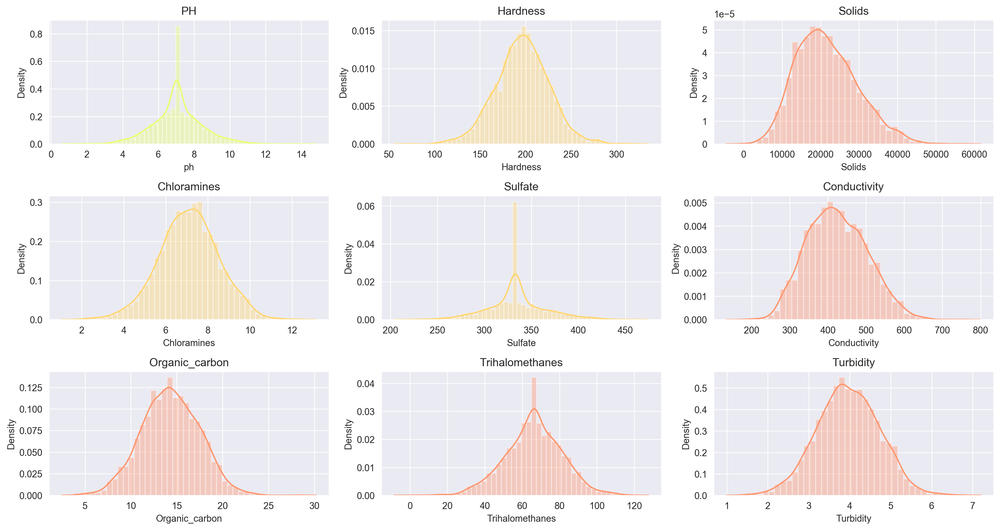

In [ ]:
fig, ax = plt.subplots(3, 3, figsize = (15,8))

plt.setp(ax[0,0], title = 'PH')
sns.distplot(wby['ph'], ax = ax[0,0], color = '#e9ff70')

plt.setp(ax[0,1], title = 'Hardness')
sns.distplot(wby['Hardness'], ax = ax[0,1], color = '#ffd670')

plt.setp(ax[0,2], title = 'Solids')
sns.distplot(wby['Solids'], ax = ax[0,2], color = '#ff9770')

plt.setp(ax[1,0], title = 'Chloramines')
sns.distplot(wby['Chloramines'], ax = ax[1,0], color = '#ffd670')

plt.setp(ax[1,1], title = 'Sulfate')
sns.distplot(wby['Sulfate'], ax = ax[1,1], color = '#ffd670')

plt.setp(ax[1,2], title = 'Conductivity')
sns.distplot(wby['Conductivity'], ax = ax[1,2], color = '#ff9770')

plt.setp(ax[2,0], title = 'Organic_carbon')
sns.distplot(wby['Organic_carbon'], ax = ax[2,0], color = '#ff9770')

plt.setp(ax[2,1], title = 'Trihalomethanes')
sns.distplot(wby['Trihalomethanes'], ax = ax[2,1], color = '#ff9770')

plt.setp(ax[2,2], title = 'Turbidity')
sns.distplot(wby['Turbidity'], ax = ax[2,2], color = '#ff9770')

plt.tight_layout()

#### Ploting Pie-Plot

([<matplotlib.patches.Wedge at 0x280c80fb550>,
 [Text(-0.47451140045829815, 0.9923905132734315, 'Contaminated Drink'),
  Text(0.47451140045829804, -0.9923905132734315, 'Pure water')],
 [Text(-0.25882440024998077, 0.5413039163309625, '64.20%'),
  Text(0.2588244002499807, -0.5413039163309625, '35.80%')])

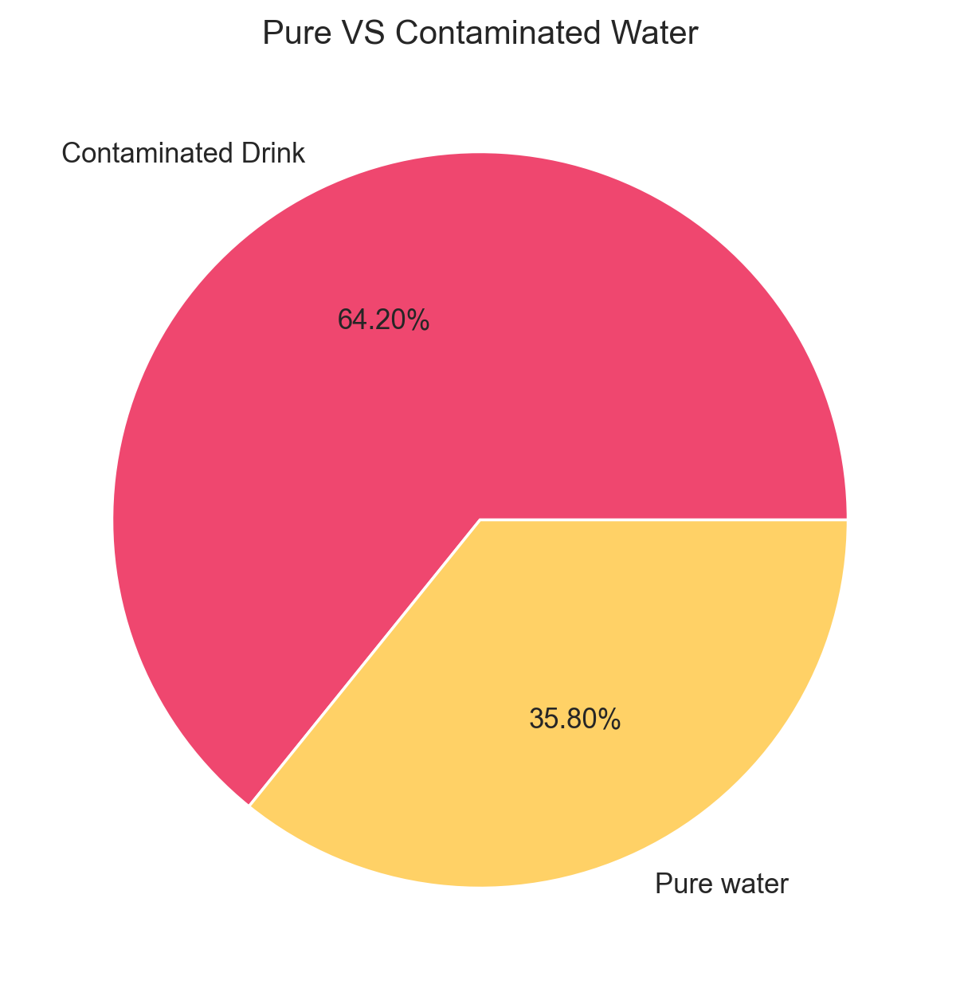

In [ ]:
fig, ax = plt.subplots(figsize = (12,6))

plt.title('Pure VS Contaminated Water')
plt.pie(wby['Potability'].value_counts(), autopct = '%0.2f%%', labels = ['Contaminated Drink', 'Pure water'], colors=['#ef476f', '#ffd166'])

### Correlation Analysis

In [51]:
sns.pairplot(wby)

plt.show()

<AxesSubplot:>

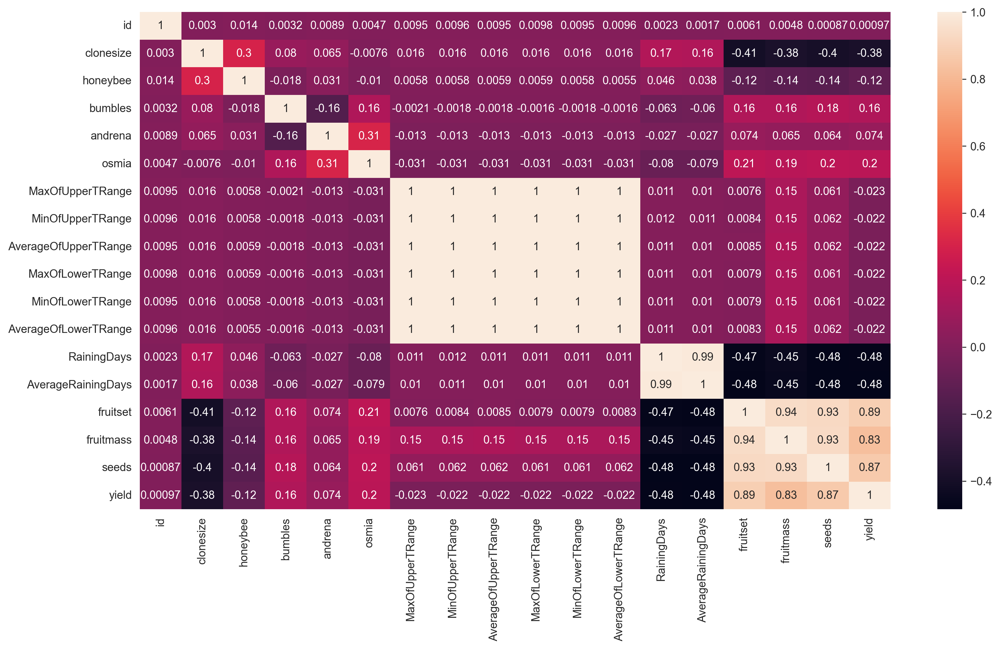

In [52]:
sns.heatmap(wby.corr(), annot = True)

### Outlier Detection

In [149]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100
        
        percentage = round(percentage, 2)

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')


In [150]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)


In [151]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st


#### Resizing Figsize

In [152]:
plt.rcParams['figure.figsize'] = (12,2)

#### Outlier Percentage (Before)

In [153]:
outlier_percentage(wby)

clonesize : 0.0 %
honeybee : 0.05 %
bumbles : 0.07 %
andrena : 0.05 %
osmia : 0.37 %
MaxOfUpperTRange : 0.0 %
MinOfUpperTRange : 0.0 %
AverageOfUpperTRange : 0.0 %
MaxOfLowerTRange : 0.0 %
MinOfLowerTRange : 0.0 %
AverageOfLowerTRange : 0.0 %
RainingDays : 23.34 %
AverageRainingDays : 0.32 %
fruitset : 0.63 %
fruitmass : 0.15 %
seeds : 0.16 %
yield : 0.17 %


#### Replacing Outlier in RainingDays Column

<AxesSubplot:>

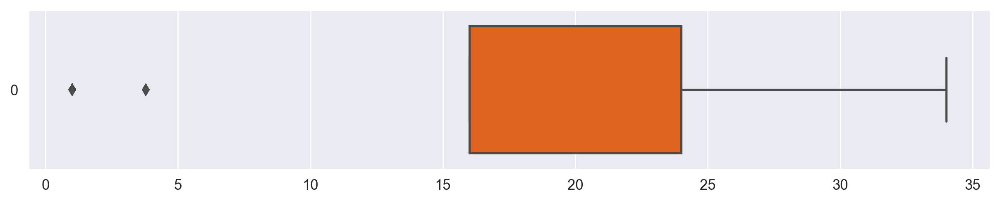

In [154]:
sns.boxplot(wby['RainingDays'], orient = 'h', color = '#FF5B00')

In [155]:
replace_outlier_extream(wby, 'RainingDays')

<AxesSubplot:>

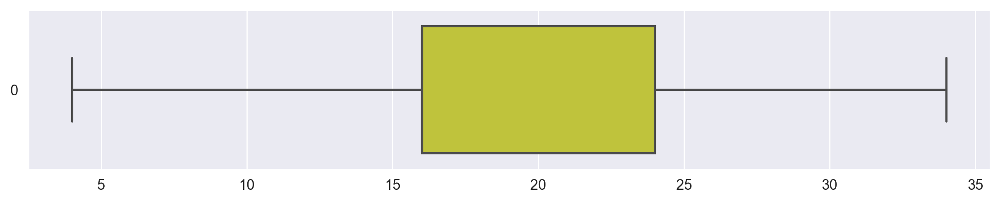

In [156]:
sns.boxplot(wby['RainingDays'], orient = 'h', color = '#D4D925')

#### Removing Outlier in honeybee Column

<AxesSubplot:>

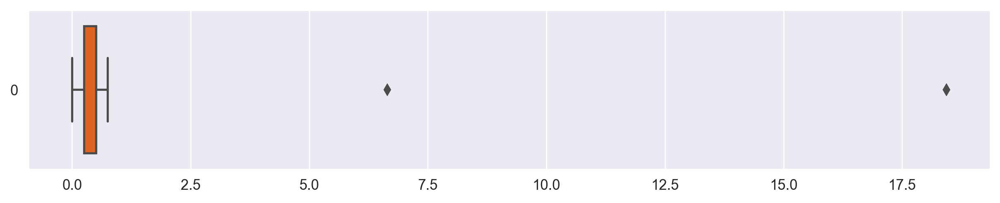

In [157]:
sns.boxplot(wby['honeybee'], orient = 'h', color = '#FF5B00')

In [158]:
wby = remove_outlier(wby, 'honeybee')

<AxesSubplot:>

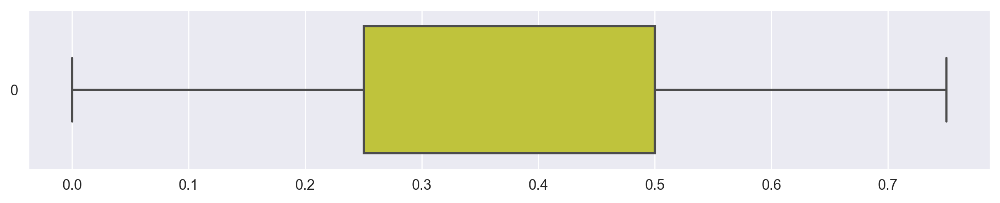

In [159]:
sns.boxplot(wby['honeybee'], orient = 'h', color = '#D4D925')

In [160]:
lost_record()

We lost 0.05 % data


#### Removing Outlier in bumbles Column

<AxesSubplot:>

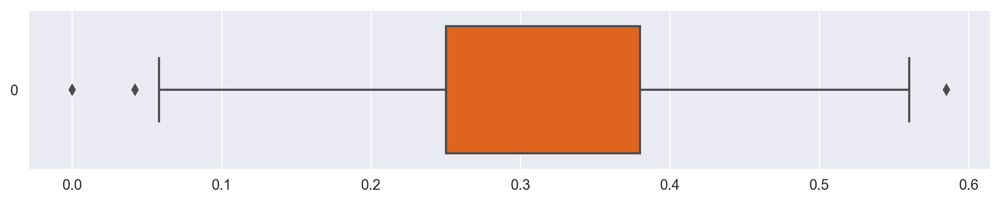

In [161]:
sns.boxplot(wby['bumbles'], orient = 'h', color = '#FF5B00')

In [162]:
wby = remove_outlier(wby, 'bumbles')

<AxesSubplot:>

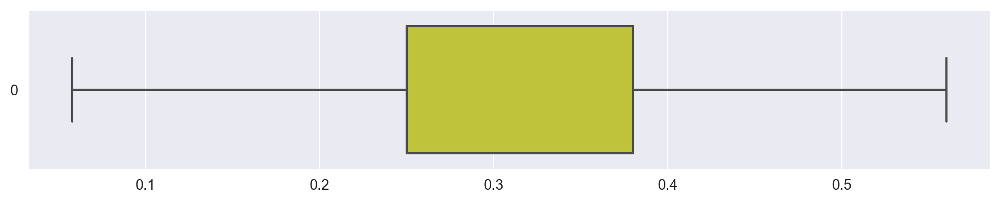

In [163]:
sns.boxplot(wby['bumbles'], orient = 'h', color = '#D4D925')

In [164]:
lost_record()

We lost 0.09 % data


#### Removing Outlier in andrena Column

<AxesSubplot:>

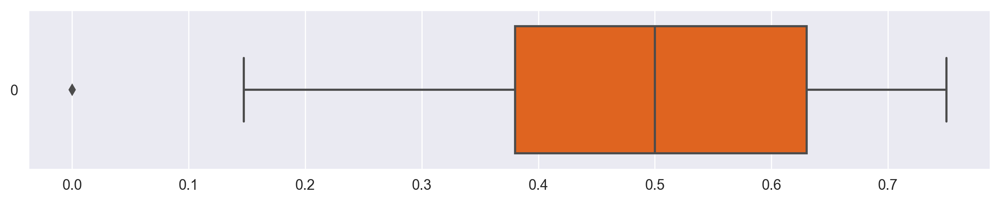

In [165]:
sns.boxplot(wby['andrena'], orient = 'h', color = '#FF5B00')

In [166]:
wby = remove_outlier(wby, 'andrena')

<AxesSubplot:>

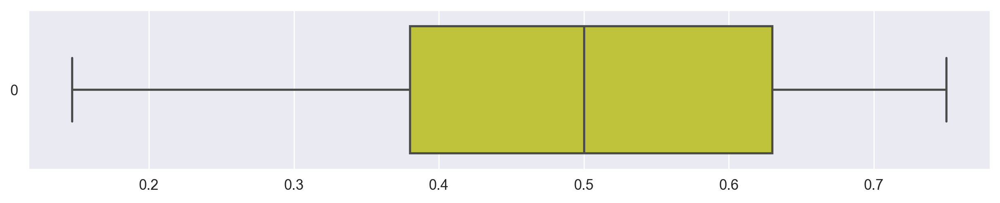

In [167]:
sns.boxplot(wby['andrena'], orient = 'h', color = '#D4D925')

In [168]:
lost_record()

We lost 0.09 % data


#### Removing Outlier in osmia Column

<AxesSubplot:>

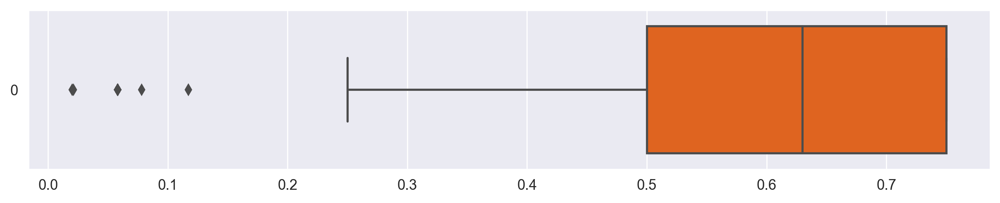

In [169]:
sns.boxplot(wby['osmia'], orient = 'h', color = '#FF5B00')

In [170]:
wby = remove_outlier(wby, 'osmia')

<AxesSubplot:>

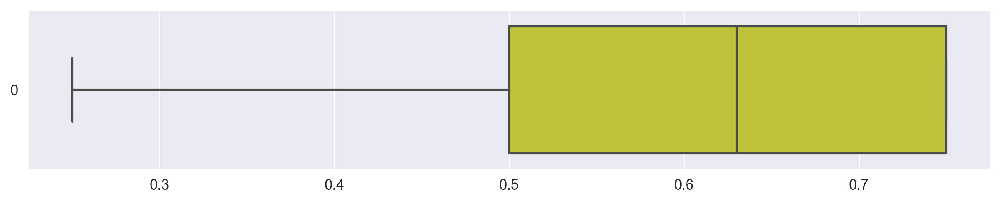

In [171]:
sns.boxplot(wby['osmia'], orient = 'h', color = '#D4D925')

In [172]:
lost_record()

We lost 0.39 % data


#### Removing Outlier in AverageRainingDays Column

<AxesSubplot:>

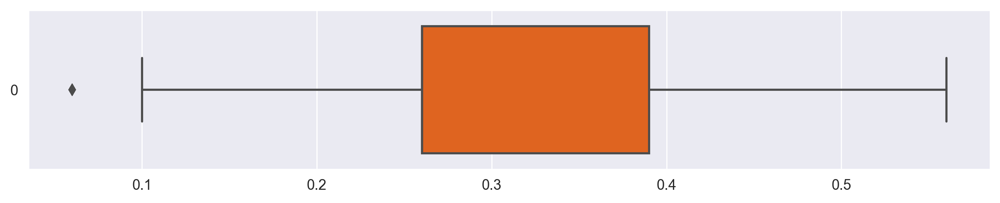

In [173]:
sns.boxplot(wby['AverageRainingDays'], orient = 'h', color = '#FF5B00')

In [174]:
wby = remove_outlier(wby, 'AverageRainingDays')

<AxesSubplot:>

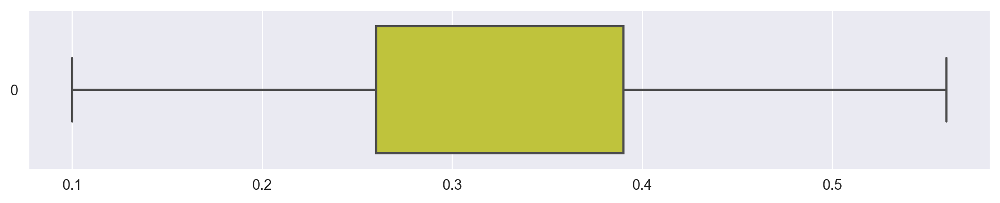

In [175]:
sns.boxplot(wby['AverageRainingDays'], orient = 'h', color = '#D4D925')

In [176]:
lost_record()

We lost 0.49 % data


#### Removing Outlier in fruitset Column

<AxesSubplot:>

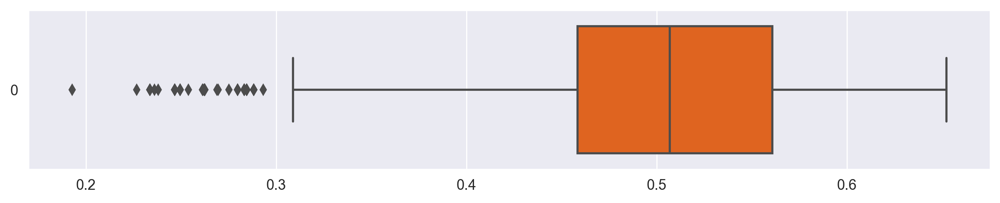

In [177]:
sns.boxplot(wby['fruitset'], orient = 'h', color = '#FF5B00')

In [178]:
wby =remove_outlier(wby, 'fruitset')

<AxesSubplot:>

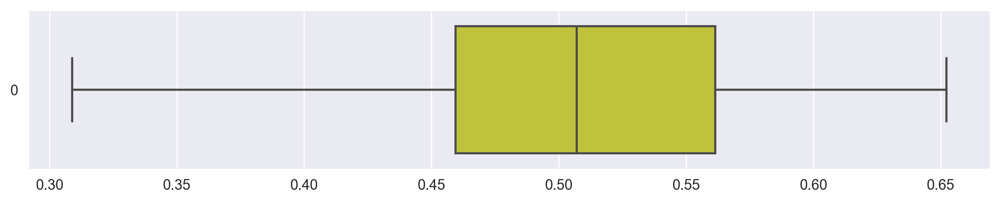

In [179]:
sns.boxplot(wby['fruitset'], orient = 'h', color = '#D4D925')

In [180]:
lost_record()

We lost 1.11 % data


#### Removing Outlier in fruitmass Column

<AxesSubplot:>

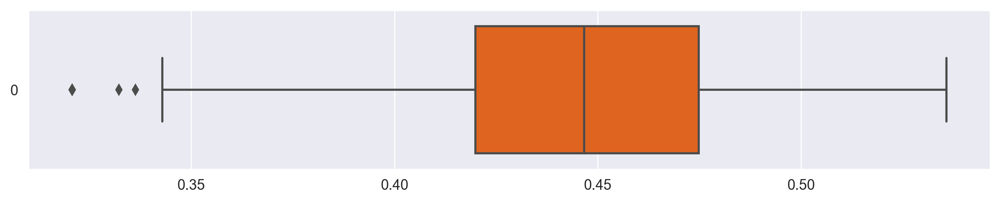

In [181]:
sns.boxplot(wby['fruitmass'], orient = 'h', color = '#FF5B00')

In [182]:
wby = remove_outlier(wby, 'fruitmass')

<AxesSubplot:>

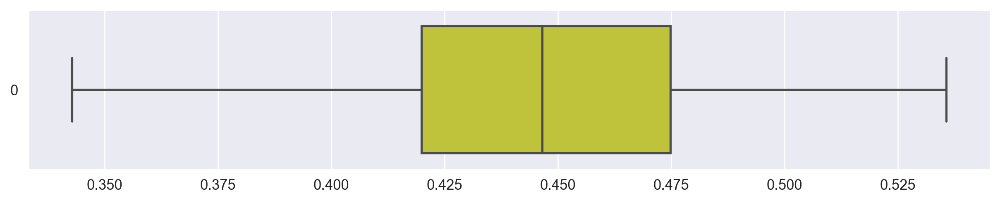

In [183]:
sns.boxplot(wby['fruitmass'], orient = 'h', color = '#D4D925')

In [184]:
lost_record()

We lost 1.15 % data


#### Removing Outlier in seeds Column

<AxesSubplot:>

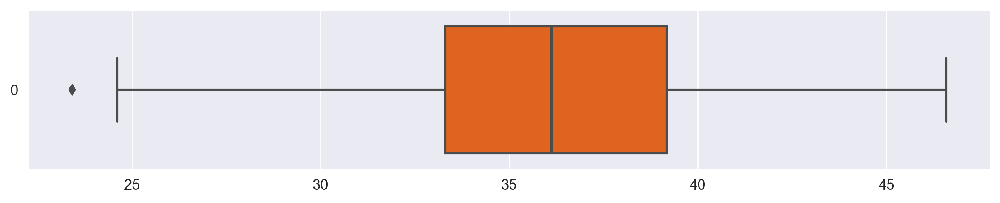

In [185]:
sns.boxplot(wby['seeds'], orient = 'h', color = '#FF5B00')

In [186]:
wby = remove_outlier(wby, 'seeds')

<AxesSubplot:>

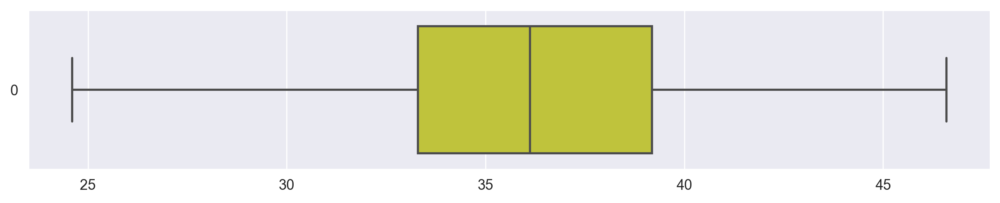

In [187]:
sns.boxplot(wby['seeds'], orient = 'h', color = '#D4D925')

In [188]:
lost_record()

We lost 1.16 % data


#### Outlier Percentage (After)

In [189]:
outlier_percentage(wby)

clonesize : 0.0 %
honeybee : 0.0 %
bumbles : 0.0 %
andrena : 0.0 %
osmia : 0.0 %
MaxOfUpperTRange : 0.0 %
MinOfUpperTRange : 0.0 %
AverageOfUpperTRange : 0.0 %
MaxOfLowerTRange : 0.0 %
MinOfLowerTRange : 0.0 %
AverageOfLowerTRange : 0.0 %
RainingDays : 0.0 %
AverageRainingDays : 0.0 %
fruitset : 0.0 %
fruitmass : 0.0 %
seeds : 0.0 %
yield : 0.12 %


#### Reindexing Columns

In [190]:
wby.reset_index(inplace=True)
wby.drop(columns=['index'], inplace=True)

wby

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15106,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.556302,0.476308,40.546480,7667.83619
15107,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354413,0.388145,29.467434,3680.56025
15108,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.422548,0.416786,32.299059,4696.44394
15109,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.542170,0.434133,36.674243,6772.93347


## Exporting Dataframe

In [191]:
#wby.to_csv('EDA.csv', index=False)